### 2.1 Import Data and Required Packages
#### Importing Pandas, Numpy, Matplotlib, Seaborn and Warings Library.

In [24]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')


### Import the CSV Data as Pandas DataFrame

In [25]:
df = pd.read_csv("data/stud.csv")

#### Show Top 5 Records

In [26]:
df.head()

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


### Shape


In [27]:
df.shape

(1000, 8)

### 2.2 Dataset information
- race/ethnicity: ethnicity of students -> (Group A, B,C, D,E)
- parental level of education : parents' final education ->(bachelor's degree,some college,master's degree,associate's degree,high school)
- lunch : having lunch before test (standard or free/reduced)
- test preparation course : complete or not complete before test
- math score
- reading score
-  writing score

### 3. Data Checks to perform
- Check Missing values
- Check Duplicates
- Check data type
- Check the number of unique values of each column
- Check statistics of data set
- Check various categories present in the different categorical column

### 3.1 check missing values

In [28]:
df.isna().sum() 

gender                         0
race/ethnicity                 0
parental level of education    0
lunch                          0
test preparation course        0
math score                     0
reading score                  0
writing score                  0
dtype: int64

In [29]:
df.duplicated().sum()

0

There are no duplicates 


### 3.3 Check Data Types

In [30]:
#check NULL and Dtypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   gender                       1000 non-null   object
 1   race/ethnicity               1000 non-null   object
 2   parental level of education  1000 non-null   object
 3   lunch                        1000 non-null   object
 4   test preparation course      1000 non-null   object
 5   math score                   1000 non-null   int64 
 6   reading score                1000 non-null   int64 
 7   writing score                1000 non-null   int64 
dtypes: int64(3), object(5)
memory usage: 62.6+ KB


### 3.4 Checking the number of unique values of each columns

In [31]:
df.nunique()

gender                          2
race/ethnicity                  5
parental level of education     6
lunch                           2
test preparation course         2
math score                     81
reading score                  72
writing score                  77
dtype: int64

### 3.5 check statistics of the dataset

In [32]:
df.describe()

,math score,reading score,writing score
count,1000.00000,1000.000000,1000.000000
mean,66.08900,69.169000,68.054000
std,15.16308,14.600192,15.195657
min,0.00000,17.000000,10.000000
25%,57.00000,59.000000,57.750000
50%,66.00000,70.000000,69.000000
75%,77.00000,79.000000,79.000000
max,100.00000,100.000000,100.000000


 Insights

- From above statistics we get to know that all means are close to each other i.e between 66 and 68.04
- all STD are also close 
- minimun score = 0 for math but much higher minimum for reading = 17 and also higher for writing  = 10 

### Exploring Data

In [33]:
df.head()

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


In [34]:
print("Categories in 'gender' variable:     ",end=" " )
print(df['gender'].unique())

print("Categories in 'race_ethnicity' variable:  ",end=" ")
print(df['race/ethnicity'].unique())

print("Categories in'parental level of education' variable:",end=" " )
print(df['parental level of education'].unique())

print("Categories in 'lunch' variable:     ",end=" " )
print(df['lunch'].unique())

print("Categories in 'test preparation course' variable:     ",end=" " )
print(df['test preparation course'].unique())

Categories in 'gender' variable:      ['female' 'male']
Categories in 'race_ethnicity' variable:   ['group B' 'group C' 'group A' 'group D' 'group E']
Categories in'parental level of education' variable: ["bachelor's degree" 'some college' "master's degree" "associate's degree"
 'high school' 'some high school']
Categories in 'lunch' variable:      ['standard' 'free/reduced']
Categories in 'test preparation course' variable:      ['none' 'completed']


In [35]:
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorial_features =  [feature for feature in df.columns if df[feature].dtype == 'O']

#print
print('we have {} numerical features:{}'.format(len(numeric_features),numeric_features))
print('we have {} categorial features:{}'.format(len(categorial_features),categorial_features))

we have 3 numerical features:['math score', 'reading score', 'writing score']
we have 5 categorial features:['gender', 'race/ethnicity', 'parental level of education', 'lunch', 'test preparation course']


### Adding Columns For "Total Score" and "Average Score"

In [36]:
df.head(2)

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88


In [37]:
df['Total_score'] = df['math score'] + df['reading score'] + df['writing score']
df['Average_score'] = df['Total_score']/3
df.head()

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score,Total_score,Average_score
0,female,group B,bachelor's degree,standard,none,72,72,74,218,72.666667
1,female,group C,some college,standard,completed,69,90,88,247,82.333333
2,female,group B,master's degree,standard,none,90,95,93,278,92.666667
3,male,group A,associate's degree,free/reduced,none,47,57,44,148,49.333333
4,male,group C,some college,standard,none,76,78,75,229,76.333333


In [38]:
reading_full = df[df['reading score']==100]['Average_score'].count()
writing_full = df[df['writing score']==100]['Average_score'].count()
math_full = df[df['math score']==100]['Average_score'].count()

print('Number Student whose  Reading score 100%: ',reading_full)
print('Number Student whose  Writing score 100%: ',writing_full)
print('Number Student whose  Math score 100%: ',math_full)

Number Student whose  Reading score 100%:  17
Number Student whose  Writing score 100%:  14
Number Student whose  Math score 100%:  7


In [39]:
reading_less_20 = df[df['reading score']<= 20]['Average_score'].count()
writing_less_20 = df[df['writing score']<= 20]['Average_score'].count()
math_less_20 = df[df['math score']<= 20]['Average_score'].count()

print('Number Student whose  Reading score less than 20%: ',reading_less_20)
print('Number Student whose  Writing score less than 20% ',writing_less_20)
print('Number Student whose  Math score less than 20%: ',math_less_20)

Number Student whose  Reading score less than 20%:  1
Number Student whose  Writing score less than 20%  3
Number Student whose  Math score less than 20%:  4


### Visualization

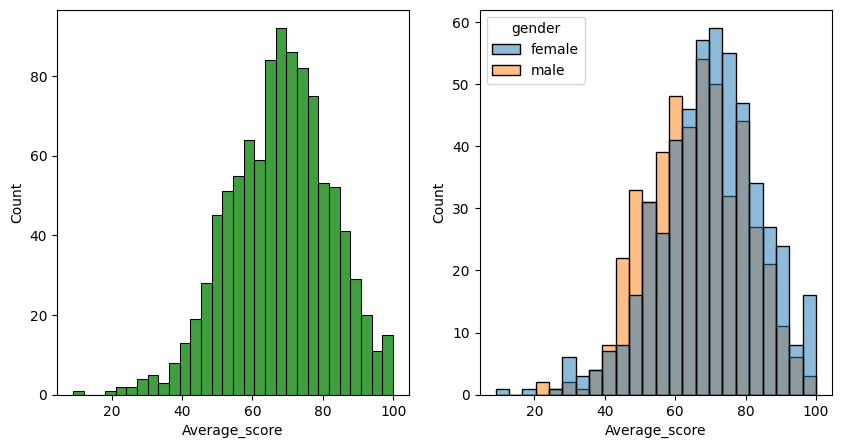

TypeError: unsupported operand type(s) for &: 'float' and 'bool'

In [40]:
sample_data = np.random.normal(loc=0, scale=1, size=100)
fig,axs = plt.subplots(1, 2, figsize=(10,5))  # First subplot in a 2x2 grid
plt.subplot(121)
sns.histplot(data = df, x = 'Average_score',bins = 30,color = 'g',)
plt.subplot(122)
sns.histplot(data = df,x='Average_score',hue = 'gender')
plt.show()
avg_count = df[(df['Average_score']) & (df['Average_score'] >= 80)]['Average_score'].count()

avg_count

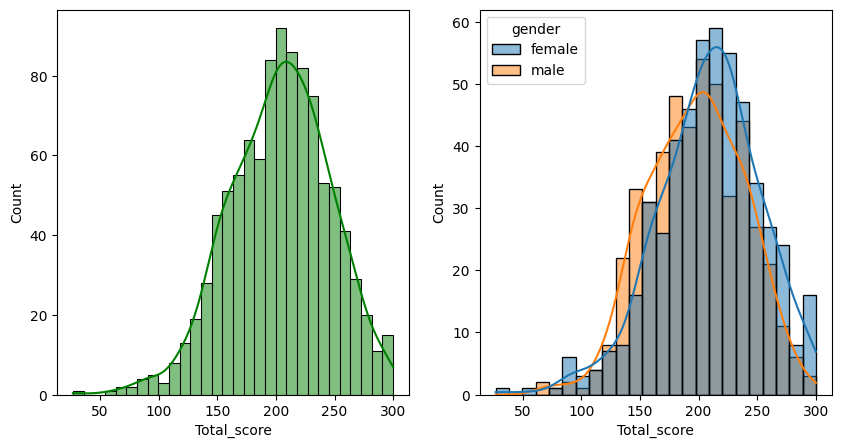

In [ ]:
fig,axs = plt.subplots(1, 2, figsize=(10,5))  # First subplot in a 2x2 grid
plt.subplot(121)
sns.histplot(data = df, x = 'Total_score',bins = 30,color = 'g',kde=True)
plt.subplot(122)
sns.histplot(data = df,x='Total_score',hue = 'gender',kde=True,color='b')
plt.show()


so we conclude that female student perform well than male students


<Axes: xlabel='Average_score', ylabel='Count'>

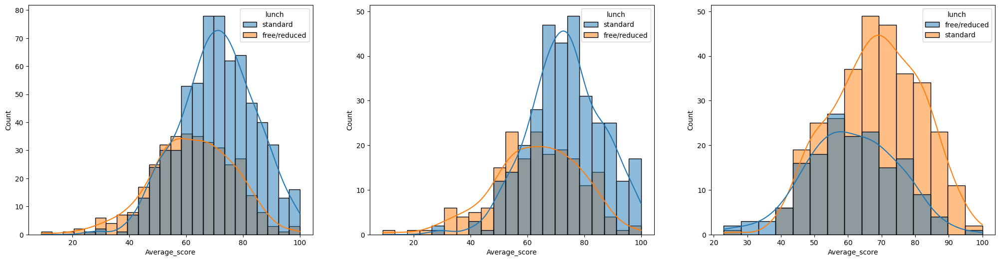

In [ ]:
plt.subplots(1,3,figsize = (25,6))
plt.subplot(131)
sns.histplot(data = df,x = 'Average_score',kde=True,hue='lunch')
plt.subplot(132)
sns.histplot(data=df[df.gender == 'female'],kde=True,hue='lunch',x='Average_score')
plt.subplot(133)
sns.histplot(data=df[df.gender == 'male'],kde=True,hue='lunch',x='Average_score',)


Conclusion:Students with standard lunch performs well in exams whether it is male or female

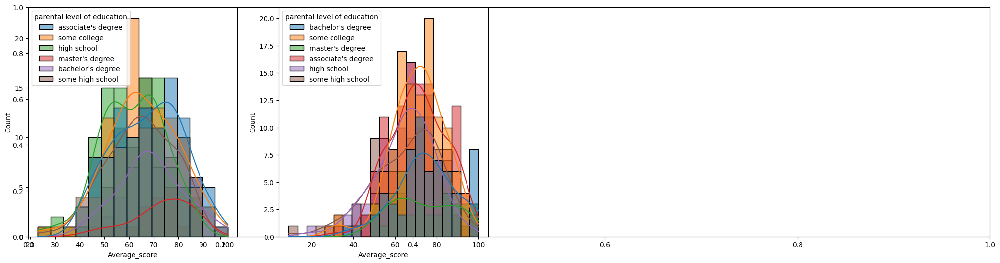

In [ ]:
plt.subplots(1,1,figsize=(25,6))

plt.subplot(141)
ax =sns.histplot(data=df[df.gender=='male'],x='Average_score',kde=True,hue='parental level of education')
plt.subplot(142)
ax =sns.histplot(data=df[df.gender=='female'],x='Average_score',kde=True,hue='parental level of education')
plt.show()

#####  Insights
- In general parent's education don't help student perform well in exam.
- 2nd plot shows that parent's whose education is of associate's degree or master's degree their male child tend to perform well in exam
- 3rd plot we can see there is no effect of parent's education on female students.

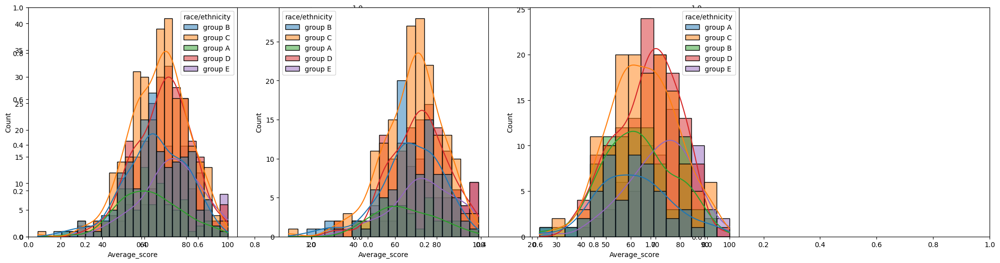

<Figure size 3000x1200 with 0 Axes>

In [ ]:
plt.subplots(1,3,figsize=(25,6))
plt.subplot(141)
ax =sns.histplot(data=df,x='Average_score',kde=True,hue='race/ethnicity')
plt.subplot(142)
ax =sns.histplot(data=df[df.gender=='female'],x='Average_score',kde=True,hue='race/ethnicity')
plt.subplot(143)
ax =sns.histplot(data=df[df.gender=='male'],x='Average_score',kde=True,hue='race/ethnicity')
plt.show()

plt.tight_layout()

Insights
- Students of group A and group B tends to perform poorly in exam.
- Students of group A and group B tends to perform poorly in exam irrespective of whether they are male or female

### Maximum Score  of students in all three subjects

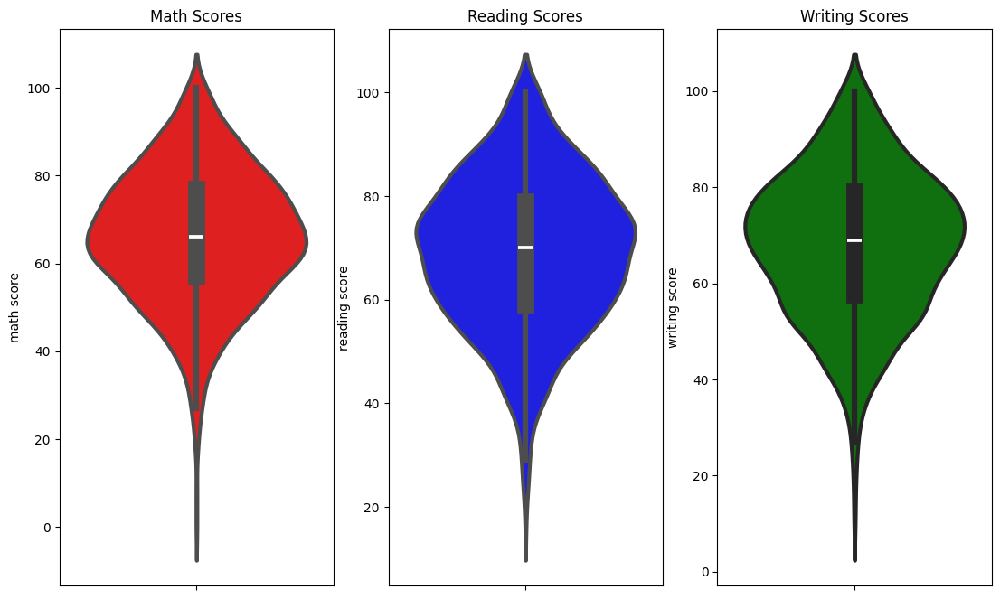

In [ ]:
plt.figure(figsize=(18,8))
plt.subplot(1,4,1)
plt.title('Math Scores')
sns.violinplot(y = 'math score',data=df,color='red',linewidth=3)
plt.subplot(1,4,2)
plt.title('Reading Scores')
sns.violinplot(y = 'reading score',data=df,color='blue',linewidth=3)
plt.subplot(1,4,3)
plt.title('Writing Scores')
sns.violinplot(y = 'writing score',data=df,color='green',linewidth=3)
plt.show()

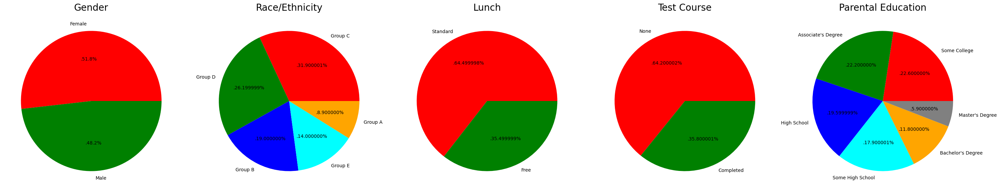

In [ ]:
plt.rcParams['figure.figsize'] =(30,12)

plt.subplot(1,5,1)
size = df['gender'].value_counts()
labels = 'Female','Male'
color = ['red','green']

plt.pie(size,colors = color,labels = labels,autopct = '.%1.1f%%')
plt.title('Gender',fontsize=20)
plt.axis('off')

plt.subplot(1, 5, 2)
size = df['race/ethnicity'].value_counts()
labels = 'Group C', 'Group D','Group B','Group E','Group A'
color = ['red', 'green', 'blue', 'cyan','orange']

plt.pie(size, colors = color,labels = labels,autopct = '.%2f%%')
plt.title('Race/Ethnicity', fontsize = 20)
plt.axis('off')



plt.subplot(1, 5, 3)
size = df['lunch'].value_counts()
labels = 'Standard', 'Free'
color = ['red','green']

plt.pie(size, colors = color,labels = labels,autopct = '.%2f%%')
plt.title('Lunch', fontsize = 20)
plt.axis('off')


plt.subplot(1, 5, 4)
size = df['test preparation course'].value_counts()
labels = 'None', 'Completed'
color = ['red','green']

plt.pie(size, colors = color,labels = labels,autopct = '.%2f%%')
plt.title('Test Course', fontsize = 20)
plt.axis('off')


plt.subplot(1, 5, 5)
size = df['parental level of education'].value_counts()
labels = 'Some College', "Associate's Degree",'High School','Some High School',"Bachelor's Degree","Master's Degree"
color = ['red', 'green', 'blue', 'cyan','orange','grey']

plt.pie(size, colors = color,labels = labels,autopct = '.%2f%%')
plt.title('Parental Education', fontsize = 20)
plt.axis('off')


plt.tight_layout()
plt.grid()

plt.show()

### Feature Wise Visualization
###  GENDER COLUMN
- How is distribution of Gender ?
- Is gender has any impact on student's performance ?

### Univariate Analysis(How is distribution of Gender)

([<matplotlib.patches.Wedge at 0x2968c548d10>,
 [Text(-0.06217041096298424, 1.0982417038160106, 'Female'),
  Text(0.06782226650507357, -1.1980818587083752, 'Male')],
 [Text(-0.033911133252536856, 0.5990409293541875, '51.8%'),
  Text(0.03956298879462625, -0.698881084246552, '48.2%')])

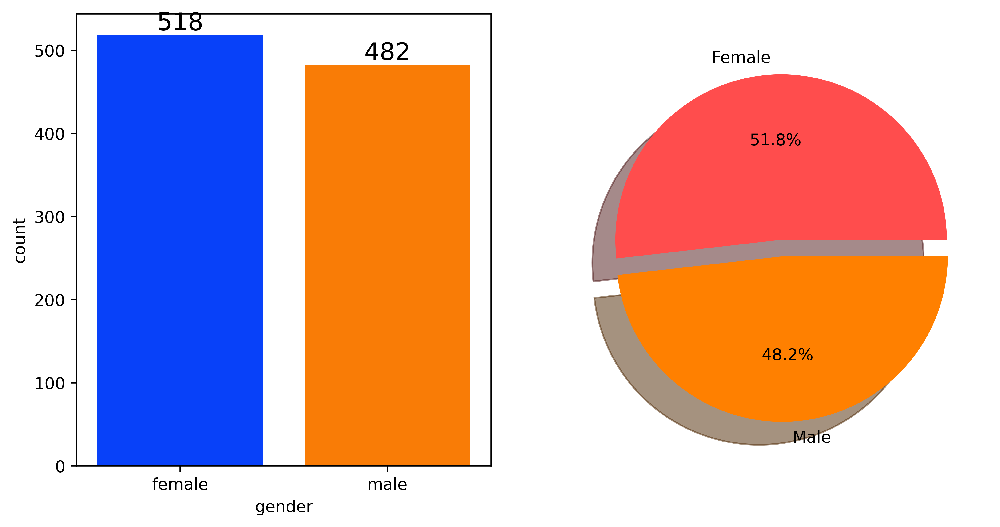

In [41]:
plt.rcParams['figure.dpi'] = 500
f,ax = plt.subplots(1,2,figsize=(10,5)) #   1 row and 2 columns and figsize is 20,10(W,H)
sns.countplot(x=df['gender'],data=df,ax=ax[0],palette='bright',saturation=0.95)#ax[0] is for 1st plot
for container in ax[0].containers:  #for each bar in the plot
    ax[0].bar_label(container,color='black',size=15)
plt.pie(x=df['gender'].value_counts(),labels=['Female','Male'],explode=[0,0.1],autopct='%1.1f%%',shadow=True,colors=['#ff4d4d','#ff8000'])

 Insights 
- Gender has balanced data with female students are 518 (48%) and male students are 482 (52%) 

#### BIVARIATE ANALYSIS ( Is gender has any impact on student's performance ? ) 

In [51]:
gender_group = df.set_index('gender').groupby(level=0)[['math score','reading score','writing score','Average_score']].agg('mean')
gender_group


,math score,reading score,writing score,Average_score
gender,,,,
female,63.633205,72.608108,72.467181,69.569498
male,68.728216,65.473029,63.311203,65.837483


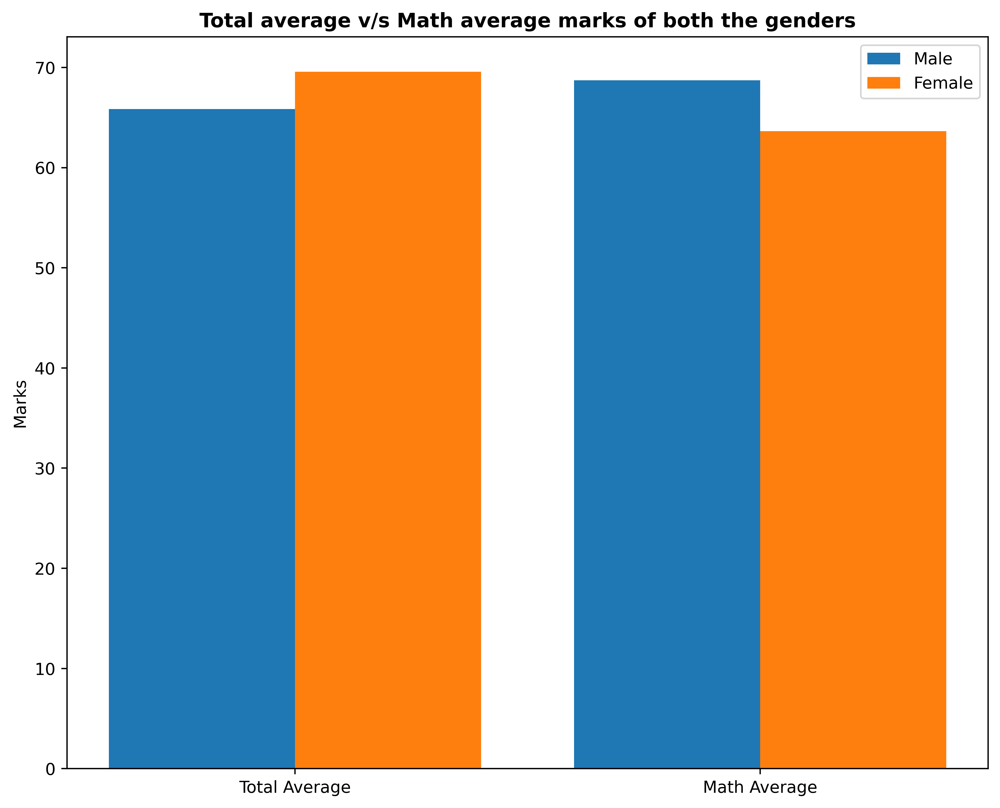

In [52]:
plt.figure(figsize=(10, 8))

X = ['Total Average','Math Average']


female_scores = [gender_group['Average_score'][0], gender_group['math score'][0]]
male_scores = [gender_group['Average_score'][1], gender_group['math score'][1]]

X_axis = np.arange(len(X))
  
plt.bar(X_axis - 0.2, male_scores, 0.4, label = 'Male')
plt.bar(X_axis + 0.2, female_scores, 0.4, label = 'Female')
  
plt.xticks(X_axis, X)
plt.ylabel("Marks")
plt.title("Total average v/s Math average marks of both the genders", fontweight='bold')
plt.legend()

#### Insights 
- On an average females have a better overall score than men.
- whereas males have scored higher in Maths.

RACE/EHNICITY COLUMN
- How is Group wise distribution ?
- Is Race/Ehnicity has any impact on student's performance ?

#### UNIVARIATE ANALYSIS ( How is Group wise distribution ?)

[<BarContainer object of 1 artists>,
 <BarContainer object of 1 artists>,
 <BarContainer object of 1 artists>,
 <BarContainer object of 1 artists>,
 <BarContainer object of 1 artists>]

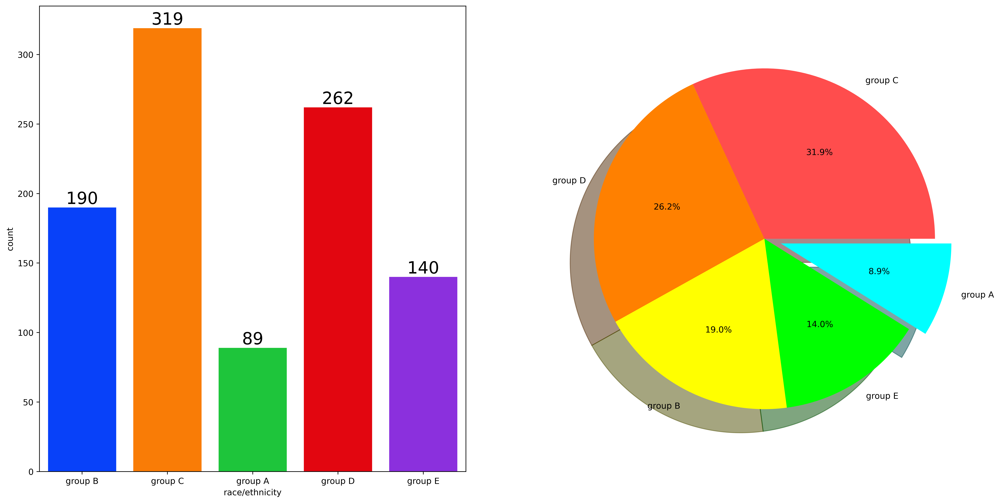

In [58]:
f,ax = plt.subplots(1,2,figsize=(20,10))
sns.countplot(x=df['race/ethnicity'],data = df ,palette='bright',ax=ax[0],saturation=0.95)
for container in ax[0].containers :
    ax[0].bar_label(container,color='black',size=20)
plt.pie(x=df['race/ethnicity'].value_counts(),labels = df['race/ethnicity'].value_counts().index,explode=[0,0,0,0,0.1],autopct='%1.1f%%',shadow=True,colors=['#ff4d4d','#ff8000','#ffff00','#00ff00','#00ffff'])


#### Insights 
- Most of the student belonging from group C /group D.
- Lowest number of students belong to groupA.

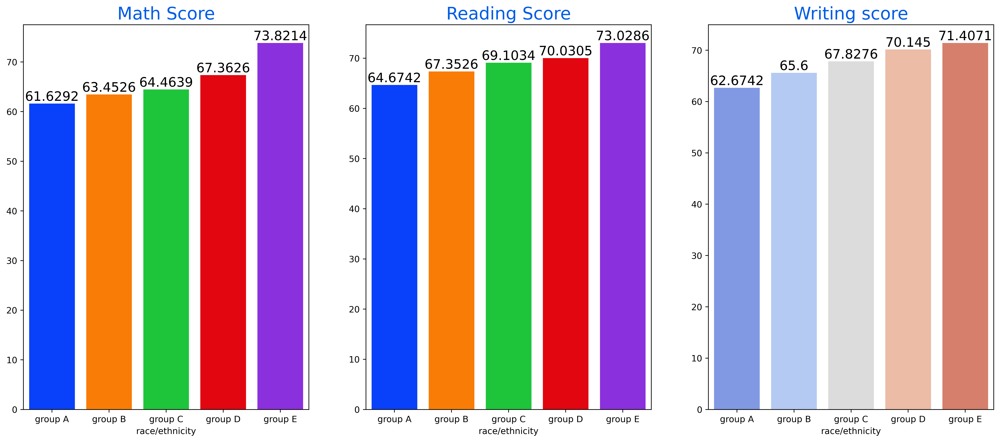

In [70]:
group_data2 = df.groupby('race/ethnicity')
f,ax = plt.subplots(1,3,figsize=(20,8))
sns.barplot(x=group_data2['math score'].mean().index,y=group_data2['math score'].mean().values,ax=ax[0],palette='bright',saturation=0.95)
ax[0].set_title('Math Score',color = '#005ce6',size=20)
for container in ax[0].containers:
    ax[0].bar_label(container,color='black',size=15)


sns.barplot(x=group_data2['reading score'].mean().index,y=group_data2['reading score'].mean().values,ax=ax[1],palette='bright',saturation=0.95)
ax[1].set_title('Reading Score',color = '#005ce6',size=20)
for container in ax[1].containers:
    ax[1].bar_label(container,color='black',size=15)

sns.barplot(x=group_data2['writing score'].mean().index,y=group_data2['writing score'].mean().values,palette = 'coolwarm',ax=ax[2])
ax[2].set_title('Writing score',color='#005ce6',size=20)

for container in ax[2].containers:
    ax[2].bar_label(container,color='black',size=15)

#### Insights 
- Group E students have scored the highest marks. 
- Group A students have scored the lowest marks. 
- Students from a lower Socioeconomic status have a lower avg in all course subjects

### PARENTAL LEVEL OF EDUCATION COLUMN
- What is educational background of student's parent ?
- Is parental education has any impact on student's performance ?

#### UNIVARIATE ANALYSIS ( What is educational background of student's parent ? )

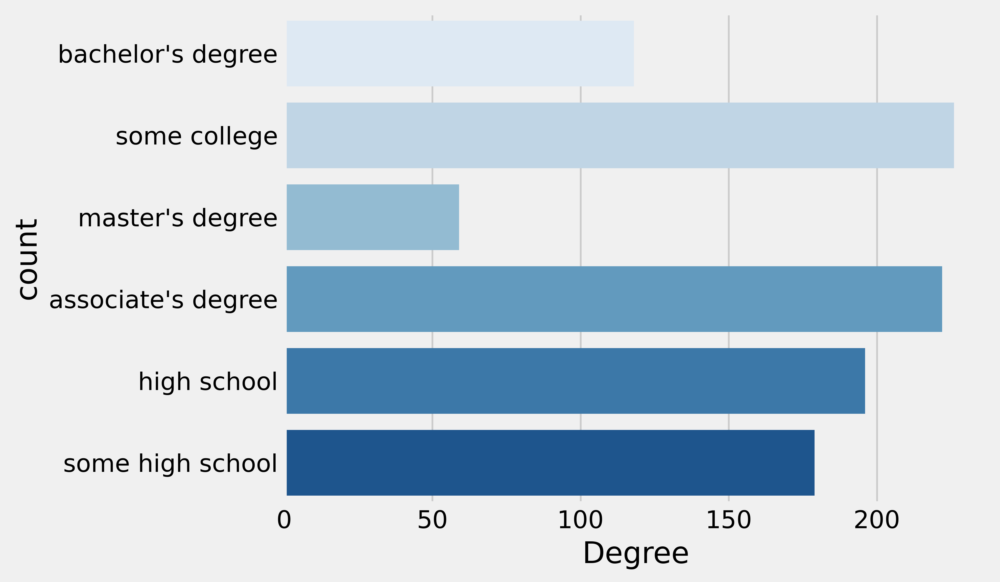

In [76]:
plt.rcParams['figure.dpi'] = 500
plt.style.use( 'fivethirtyeight')
sns.countplot(df['parental level of education'],palette = 'Blues')
plt.xlabel('Degree')
plt.ylabel('count')
plt.show()


#### Insights 
- Largest number of parents are from some college.

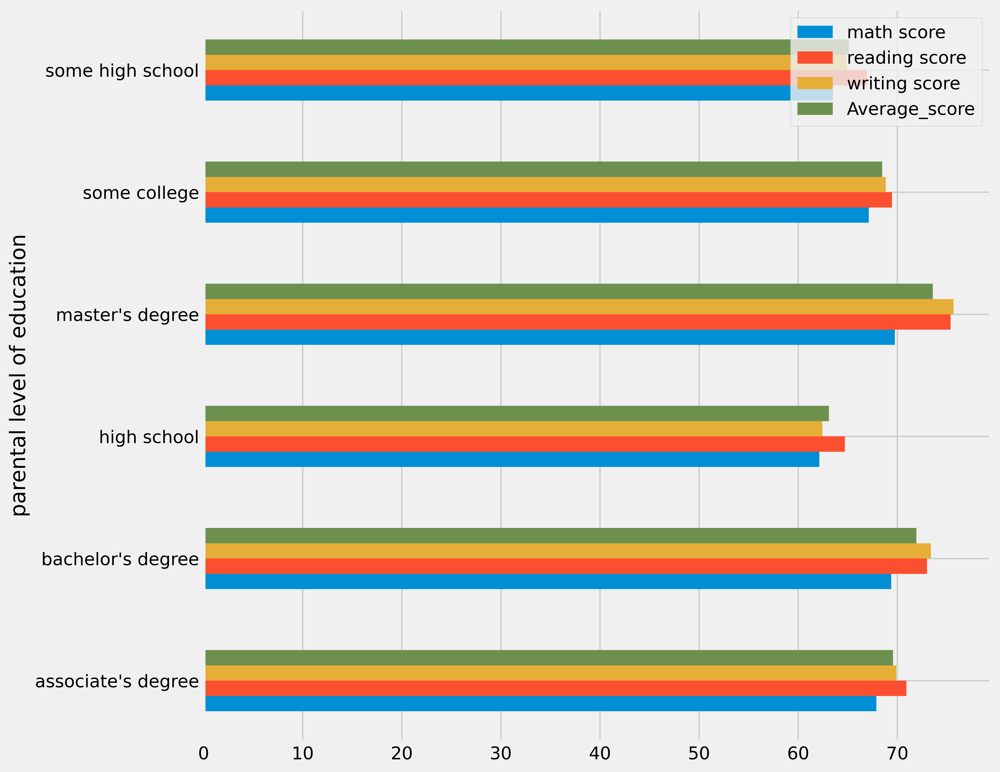

In [91]:
gender_group = df.set_index('parental level of education').groupby(level=0)[['math score','reading score','writing score','Average_score']].agg('mean').plot(kind='barh',figsize=(10,10))


#### Insights 
- The score of student whose parents possess master and bachelor level education are higher than others.

### LUNCH COLUMN 
- Which type of lunch is most common amoung students ?
- What is the effect of lunch type on test results?

### UNIVARIATE ANALYSIS ( Which type of lunch is most common amoung students ? )


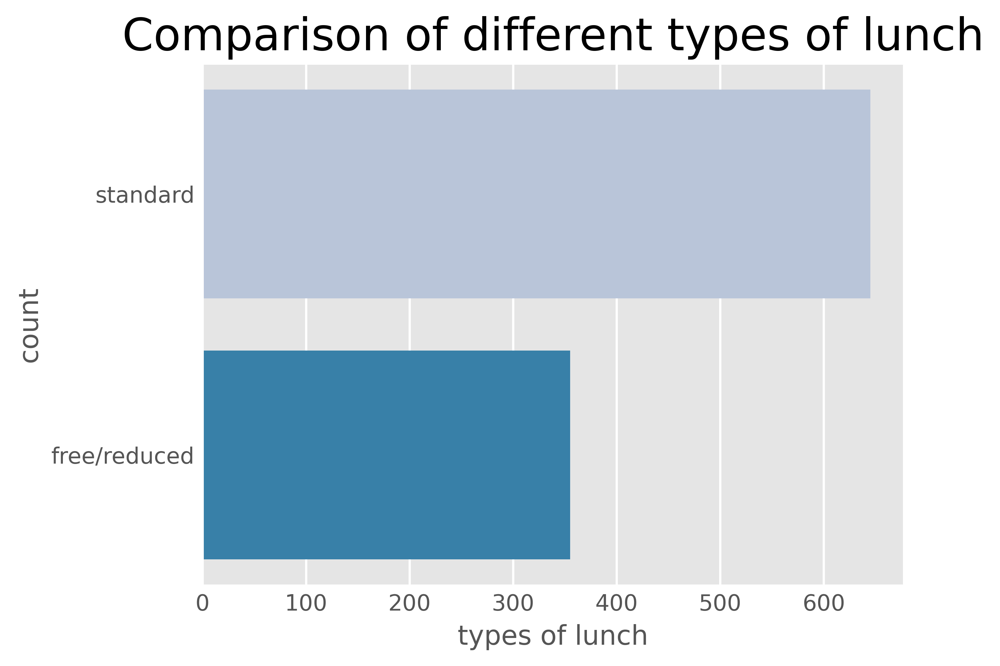

In [98]:
plt.rcParams['figure.dpi'] = 500
plt.rcParams['figure.figsize'] = (5,4)
plt.style.use('ggplot')
sns.countplot(df['lunch'], palette = 'PuBu')
plt.title('Comparison of different types of lunch', fontweight = 30, fontsize = 20)
plt.xlabel('types of lunch')
plt.ylabel('count')
plt.show()

#### Insights 
- Students being served Standard lunch was more than free lunch


#### BIVARIATE ANALYSIS (  Is lunch type intake has any impact on student's performance ? )

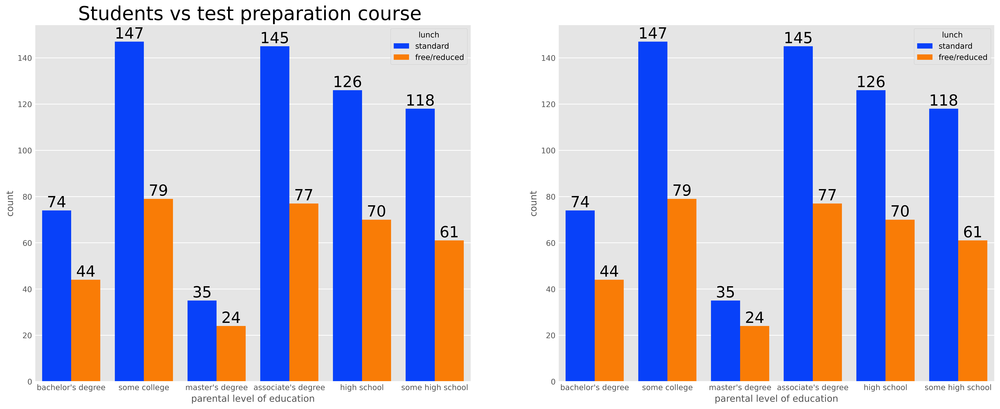

In [100]:
f,ax=plt.subplots(1,2,figsize=(20,8))
sns.countplot(x=df['parental level of education'],data=df,palette = 'bright',hue='lunch',saturation=0.95,ax=ax[0])
ax[0].set_title('Students vs test preparation course ',color='black',size=25)
for container in ax[0].containers:
    ax[0].bar_label(container,color='black',size=20)
    
sns.countplot(x=df['parental level of education'],data=df,palette = 'bright',hue='lunch',saturation=0.95,ax=ax[1])
for container in ax[1].containers:
    ax[1].bar_label(container,color='black',size=20)   

#### Insights 
- Students who get Standard Lunch tend to perform better than students who got free/reduced lunch

#### TEST PREPARATION COURSE COLUMN 
- Which type of lunch is most common amoung students ?
- Is Test prepration course has any impact on student's performance ?

#### BIVARIATE ANALYSIS ( Is Test prepration course has any impact on student's performance ? )

<Axes: xlabel='lunch', ylabel='writing score'>

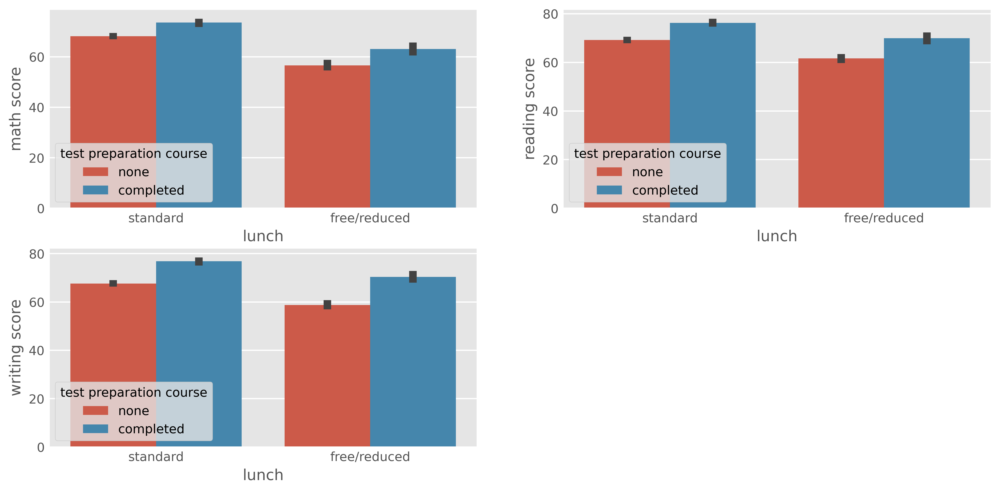

In [102]:
plt.figure(figsize=(12,6))
plt.subplot(2,2,1)
sns.barplot (x=df['lunch'], y=df['math score'], hue=df['test preparation course'])
plt.subplot(2,2,2)
sns.barplot (x=df['lunch'], y=df['reading score'], hue=df['test preparation course'])
plt.subplot(2,2,3)
sns.barplot (x=df['lunch'], y=df['writing score'], hue=df['test preparation course'])


#### Insights  
- Students who have completed the Test Prepration Course have scores higher in all three categories than those who haven't taken the course

####  CHECKING OUTLIERS

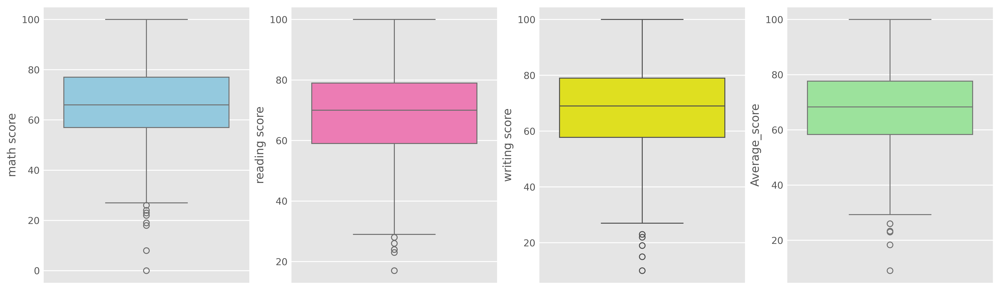

In [105]:
plt.subplots(1,4,figsize=(16,5))
plt.subplot(141)
sns.boxplot(df['math score'],color='skyblue')
plt.subplot(142)
sns.boxplot(df['reading score'],color='hotpink')
plt.subplot(143)
sns.boxplot(df['writing score'],color='yellow')
plt.subplot(144)
sns.boxplot(df['Average_score'],color='lightgreen')
plt.show()

#### 4.4.7 MUTIVARIATE ANALYSIS USING PAIRPLOT

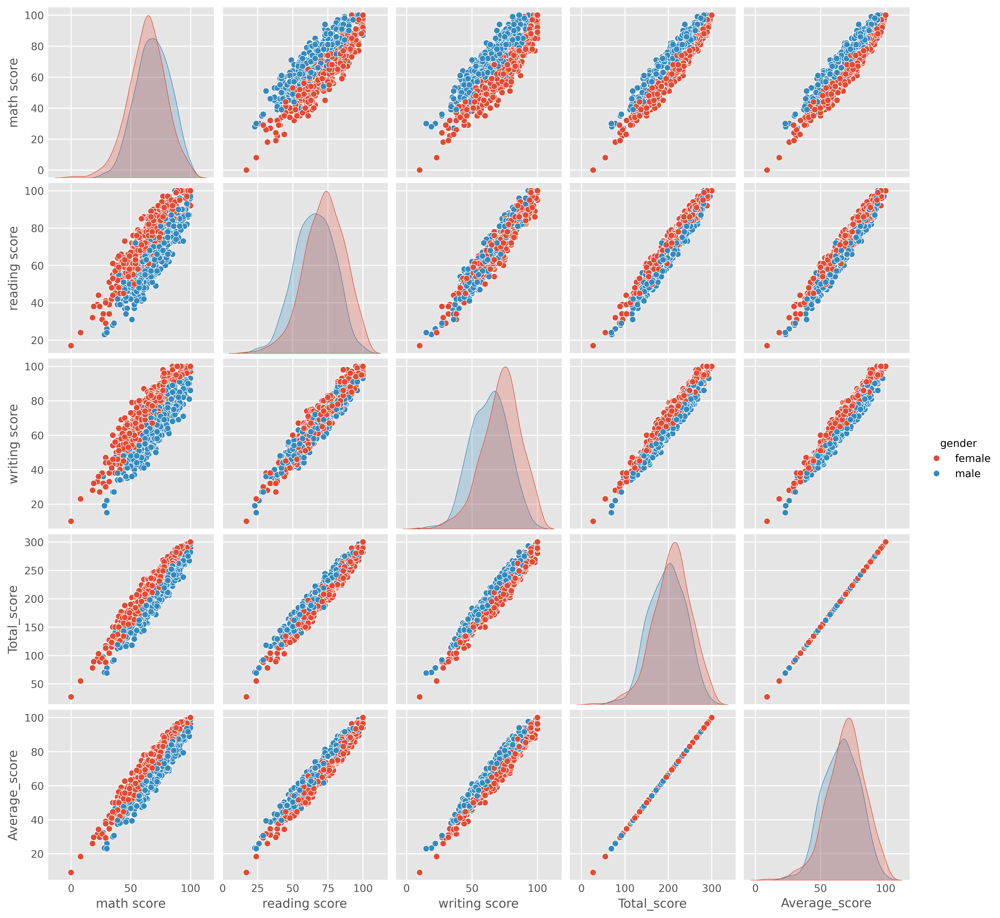

In [106]:
sns.pairplot(df,hue = 'gender')
plt.show()

#### Insights
- From the above plot it is clear that all the scores increase linearly with each other.

### 5. Conclusions
- Student's Performance is related with lunch, race, parental level education
- Females lead in pass percentage and also are top-scorers
- Student's Performance is not much related with test preparation course
- Finishing preparation course is benefitial.